In [1]:
import warnings
warnings.filterwarnings('ignore')

!pip install 'torchsummary'

import os
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from PIL import Image
from tqdm import tqdm
%matplotlib inline

# tweaks for libraries
np.set_printoptions(precision=6, linewidth=1024, suppress=True)
plt.style.use('seaborn')
sns.set(style='darkgrid', context='notebook',font_scale=1.10)

# Pytorch
import torch
gpu_available = torch.cuda.is_available()
print('Using Pytorch version %s. GPU %s available' % (torch.__version__, "IS" if gpu_available else "IS **NOT**"))
import torch.nn as nn
import torch.nn.functional as F
from torchvision import datasets, transforms
from torch import optim
from torch.utils.data.dataset import Dataset
from torchsummary import summary

# to ensure that you get consistent results
# @see: https://discuss.pytorch.org/t/reproducibility-over-different-machines/63047
seed = 123
random.seed(seed)
os.environ['PYTHONHASHSEED'] = str(seed)
np.random.seed(seed)
torch.manual_seed(seed);

if torch.cuda.is_available():
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.enabled = False

Using Pytorch version 2.4.0. GPU IS available


In [2]:
DATA_FOLDER = '/kaggle/input/histopathologic-cancer-detection/'
df = pd.read_csv(DATA_FOLDER + 'train_labels.csv')
df.head()

,id,label
0,f38a6374c348f90b587e046aac6079959adf3835,0
1,c18f2d887b7ae4f6742ee445113fa1aef383ed77,1
2,755db6279dae599ebb4d39a9123cce439965282d,0
3,bc3f0c64fb968ff4a8bd33af6971ecae77c75e08,0
4,068aba587a4950175d04c680d38943fd488d6a9d,0


In [3]:
# Checking if there were any null;
len(df[df.isnull().any(axis=1)])

0

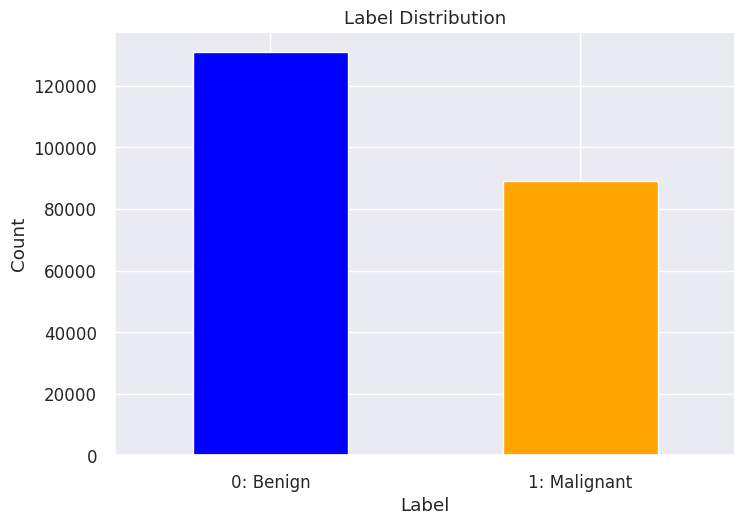

In [4]:
# Let's check the distribution of target labels
ax = df['label'].value_counts().plot(kind='bar', color=['blue', 'orange'])

ax.set_xticks([0, 1])
ax.set_xticklabels(['0: Benign', '1: Malignant'])
plt.xticks(rotation=0)
ax.set_xlabel('Label')
ax.set_ylabel('Count')
ax.set_title('Label Distribution')

plt.show()

In [5]:
# Let's save the benign & malignant counts
num_benign, num_malignant = np.bincount(df['label'])
print(f"Found {num_benign} benign cases and {num_malignant} cases in dataset")

Found 130908 benign cases and 89117 cases in dataset


# Data Preprocessing


In [6]:
def get_data():
    # plot the label distribusion to check the label balance  
    df = pd.read_csv(DATA_FOLDER + 'train_labels.csv')
    ax = df['label'].value_counts().plot(kind='bar', color=['blue', 'orange'])
    ax.set_xticks([0, 1])
    ax.set_xticklabels(['0: Benign', '1: Malignant'])
    plt.xticks(rotation=0)
    ax.set_xlabel('Label')
    ax.set_ylabel('Count')
    ax.set_title('Diagnosis')
    plt.show()
    
    # Shuffle the dataframe
    df = df.sample(frac=1).reset_index(drop=True) # frac=1: 
    print(f'Found {len(df[df.isnull().any(axis=1)])} after shuffling')
    
    # split into train/cross-val/test datasets (use stratify so we get a similar distribution)
    image_ids, labels = df['id'], df['label']
    X_train, X_test, y_train, y_test = \
      train_test_split(image_ids, labels, test_size=0.30, random_state=seed, stratify=labels)
    X_val, X_test, y_val, y_test = \
      train_test_split(X_test, y_test, test_size=0.20, random_state=seed, stratify=y_test)
    print(X_train.shape, y_train.shape, X_val.shape, y_val.shape, X_test.shape, y_test.shape)
    
    X_train_image_paths = [os.path.join(DATA_FOLDER, 'train', image_id + '.tif') for image_id in X_train.values]
    X_val_image_paths = [os.path.join(DATA_FOLDER, 'train', image_id + '.tif') for image_id in X_val.values]
    X_test_image_paths = [os.path.join(DATA_FOLDER, 'train', image_id + '.tif') for image_id in X_test.values]

    return (X_train_image_paths, y_train.values, X_train.values), \
           (X_val_image_paths, y_val.values, X_val.values), \
           (X_test_image_paths, y_test.values, X_test.values)

In [7]:
def display_sample(sample_images, sample_labels, sample_predictions=None, grid_shape=(8, 8), 
                   plot_title=None, fig_size=None):
    """ 
    display a random selection of images & corresponding labels, optionally with predictions
    The display is laid out in a grid of num_rows x num_col cells
    If sample_predictions are provided, then each cell's title displays the prediction
    (if it matches actual) or actual/prediction if there is a mismatch
    """
    num_rows, num_cols = grid_shape
    assert len(sample_images) == num_rows * num_cols

    # a dict to help encode/decode the labels 
    LABELS = {
        1: 'Malignant',
        0: 'Benign'
    }

    with sns.axes_style("whitegrid"):
        sns.set_context("notebook", font_scale=1.1)
        sns.set_style({"font.sans-serif": ["Verdana", "Arial", "Calibri", "DejaVu Sans"]})
        
        f, ax = plt.subplots(num_rows, num_cols, figsize=((20, 20) if fig_size is None else fig_size),
                            gridspec_kw={"wspace": 0.02, "hspace": 0.25}, squeeze=True)
        # fig = ax[0].get_figure()
        f.tight_layout()
        f.subplots_adjust(top=0.95)

        for r in range(num_rows):
            for c in range(num_cols):
                image_index = r * num_cols + c
                ax[r, c].axis("off")

                # show selected image
                sample_image = sample_images[image_index]
                # got image as (NUM_CHANNELS, IMAGE_HEIGHT, IMAGE_WIDTH)
                sample_image = sample_image.transpose((1, 2, 0))
                # sample_image = sample_image * 0.5 + 0.5  # since we applied this normalization
                # sample_image *= 255.0

                ax[r, c].imshow(sample_image)

                if sample_predictions is None:
                    # show the actural labels in the cell title
                    title = ax[r, c].set_title("%s" % LABELS[sample_labels[image_index]])
                else:
                    # else check if prediction matches actual value
                    true_label = sample_labels[image_index]
                    pred_label = sample_predictions[image_index]
                    prediction_matches_true = (true_label == pred_label)
                    if prediction_matches_true:
                        # if actual == prediction, cell title is prediction shown in green frot
                        title = LABELS[true_label]
                        title_color = 'g'
                    else:
                        # if actual != prediction, cell title is actual/prediction in red font
                        title = '%s\n%s' % (LABELS[true_label], LABELS[pred_label])
                        title_color = 'r'
                    # display cell title
                    title = ax[r, c].set_title(title)
                    plt.setp(title, color=title_color)
        # set plot title, if one specified
        if plot_title is not None:
            f.suptitle(plot_title)

        plt.show()
        plt.close()

Bundling image files with their labels, ids and transforms.

In [8]:
class HistoDataset(Dataset):
    def __init__(self, image_paths, labels=None, ids=None, transforms=None):
        self.image_paths = image_paths
        self.labels = labels
        self.ids = ids
        self.transforms = transforms
        
    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, index):
        """
        Open a PIL image, apply transforms (if any) & convert to Numpy array
        and return array and label at index
        """
        image_path = self.image_paths[index]

        img = Image.open(image_path)

        img = self.transforms(img)

        img_id = self.ids[index]
        
        if self.labels is not None:
            label = self.labels[index]
            return img, label, img_id     
        
        return img, img_id 

> ### Data Augmentation:
Torchvision's transforms.Compose sequentially handles the transforms.


In [9]:
# We are scaling all images to same size + converting them to tensors & normalizing data
xforms = {
    'train': transforms.Compose([
        transforms.Resize((96,96)),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomVerticalFlip(p=0.5),
        transforms.RandomRotation(25),
        transforms.RandomResizedCrop(96,scale=(0.8,1.0),ratio=(1.0,1.0)),
        transforms.ToTensor(),
        transforms.Normalize([0.5,0.5,0.5], [0.5,0.5,0.5])
    ]),
    'eval': transforms.Compose([
        transforms.Resize((96,96)),
        transforms.ToTensor(),
    ]),    
    'test': transforms.Compose([
        transforms.Resize((96,96)),
        transforms.ToTensor(),
    ]),
}

Here we prepare our dataset to feed into dataloader.
Note, all the datasets below are originated from 'train data' only.
We will touch the 'real' test dataset (/kaggle/input/test) later in this notebook.

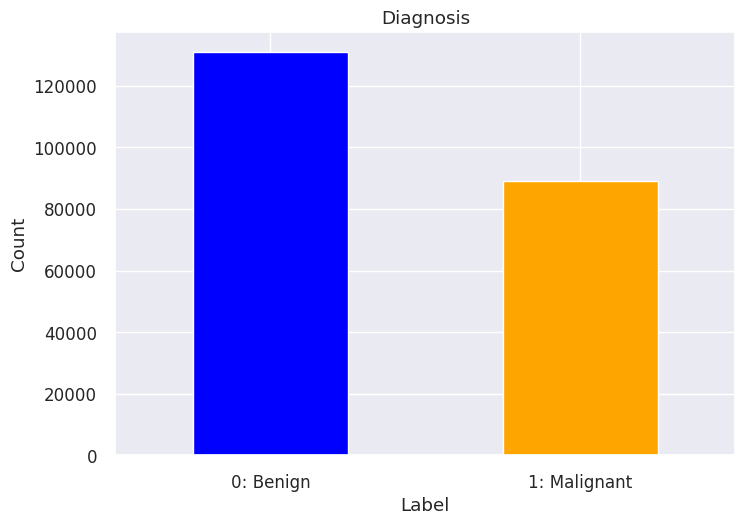

Found 0 after shuffling
(154017,) (154017,) (52806,) (52806,) (13202,) (13202,)


In [10]:
# define our datasets
# Load data
(X_train_paths, y_train, train_ids), (X_val_paths, y_val, val_ids), (X_test_paths, y_test, test_ids) = get_data()

train_dataset = HistoDataset(X_train_paths, y_train, train_ids, xforms['train'])
eval_dataset = HistoDataset(X_val_paths, y_val, val_ids, xforms['eval'])
# This test_dataset below as well divided from the train data.
test_dataset = HistoDataset(X_test_paths, y_test, test_ids, xforms['test'])

Dataset: image.shape = torch.Size([64, 3, 96, 96]), labels.shape = torch.Size([64])


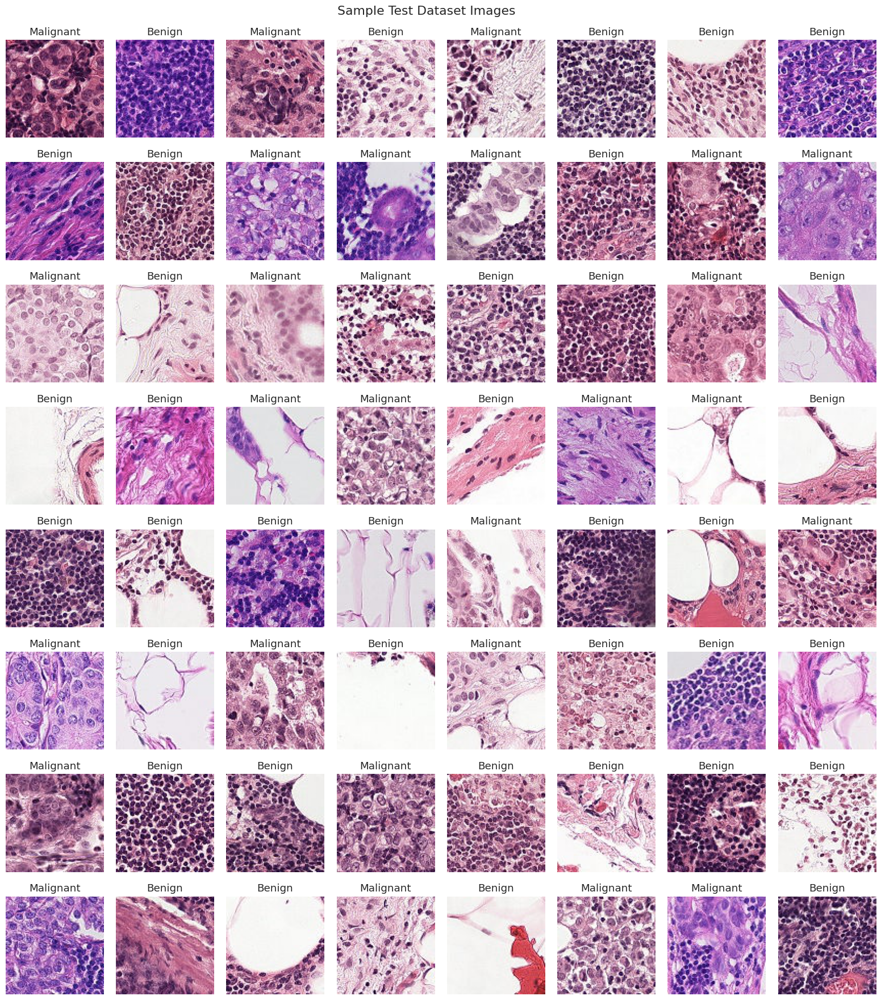

In [11]:
# let's view a sample of 64 images from the test dataset
loader = torch.utils.data.DataLoader(test_dataset, batch_size=64, shuffle=False)
data_iter = iter(loader)
sample_images, sample_labels, _ = next(data_iter)  # fetch first batch of 64 images & labels
print(f'Dataset: image.shape = {sample_images.shape}, labels.shape = {sample_labels.shape}')
display_sample(sample_images.cpu().numpy(), sample_labels.cpu().numpy(), plot_title="Sample Test Dataset Images");     

### Hyperparameters

In [12]:
IMAGE_WIDTH, IMAGE_HEIGHT, NUM_CHANNELS, NUM_CLASSES = 96, 96, 3, 2
NUM_EPOCHS, BATCH_SIZE, LR_RATE, L2_REG = 1, 256, 3e-3, 0.0075
#NUM_EPOCHS, BATCH_SIZE, LR_RATE, L2_REG = 100, 128, 3e-3, 0.0075

# Building Model Function

In [13]:
def build_model():
    net = nn.Sequential(
        nn.Conv2d(NUM_CHANNELS, 8, 3, padding=1),
        nn.ReLU(),
        nn.BatchNorm2d(8),
        nn.MaxPool2d(kernel_size=2, stride=2),
        
        nn.Conv2d(8, 16, 3, padding=1),
        nn.ReLU(),
        nn.BatchNorm2d(16),
        nn.MaxPool2d(kernel_size=2, stride=2),
        
        nn.Conv2d(16, 32, 3, padding=0),
        nn.ReLU(),
        nn.BatchNorm2d(32),
        nn.MaxPool2d(kernel_size=2, stride=2),
        
        nn.Conv2d(32, 64, 3, padding=0),
        nn.ReLU(),
        nn.BatchNorm2d(64),
        nn.MaxPool2d(kernel_size=2, stride=2),
        
        nn.Flatten(),
        
        nn.Linear(64*4*4, 512),
        nn.ReLU(),
        nn.Dropout(0.25),
        
        nn.Linear(512, NUM_CLASSES),
        nn.LogSoftmax(dim=1)
    )
    model = net
    class_counts = [num_benign, num_malignant]
    weights = torch.FloatTensor(class_counts) / (num_benign + num_malignant)
    weights = weights.cuda() if torch.cuda.is_available() else weights.cpu()

    # since data is imbalanced, we need to apply weights to the loss function
    criterion = nn.CrossEntropyLoss(weight=weights, reduction='sum')
    #criterion = nn.NLLLoss(weight=weights, reduction='sum')
    optimizer = optim.Adam(params=model.parameters(), lr=LR_RATE, weight_decay=L2_REG)

    return model, criterion, optimizer

In [14]:
model, criterion, optimizer = build_model()

from torchinfo import summary
print(summary(model, input_size=(1, NUM_CHANNELS, IMAGE_HEIGHT, IMAGE_WIDTH))) # for batch_size = 1

Layer (type:depth-idx)                   Output Shape              Param #
Sequential                               [1, 2]                    --
├─Conv2d: 1-1                            [1, 8, 96, 96]            224
├─ReLU: 1-2                              [1, 8, 96, 96]            --
├─BatchNorm2d: 1-3                       [1, 8, 96, 96]            16
├─MaxPool2d: 1-4                         [1, 8, 48, 48]            --
├─Conv2d: 1-5                            [1, 16, 48, 48]           1,168
├─ReLU: 1-6                              [1, 16, 48, 48]           --
├─BatchNorm2d: 1-7                       [1, 16, 48, 48]           32
├─MaxPool2d: 1-8                         [1, 16, 24, 24]           --
├─Conv2d: 1-9                            [1, 32, 22, 22]           4,640
├─ReLU: 1-10                             [1, 32, 22, 22]           --
├─BatchNorm2d: 1-11                      [1, 32, 22, 22]           64
├─MaxPool2d: 1-12                        [1, 32, 11, 11]           --
├─Conv2d

# Training Function 
# (recording history as well)

In [15]:
history = {
    'train_loss': [],
    'val_loss': [],
    'train_acc': [],
    'val_acc': []
}

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

def train_model(model, train_loader, val_loader, criterion, optimizer, scheduler, num_epochs):
    model.to(device)
    
    for epoch in range(num_epochs):
        print(f"Epoch {epoch+1}/{num_epochs}")
        print('-' * 20)

        # Training Phase
        model.train()
        train_loss = 0.0
        train_correct = 0
        train_total = 0

        for inputs, labels, _ in tqdm(train_loader):
            inputs, labels = inputs.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            train_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            train_correct += (preds == labels).sum().item()
            train_total += labels.size(0)

        epoch_train_loss = train_loss / train_total
        epoch_train_acc = train_correct / train_total
        print(f"Train Loss: {epoch_train_loss:.4f} | Train Acc: {epoch_train_acc:.4f}")

        # Validation Phase
        model.eval()
        val_loss = 0.0
        val_correct = 0
        val_total = 0

        with torch.no_grad():
            for inputs, labels, _ in val_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * inputs.size(0)
                _, preds = torch.max(outputs, 1)
                val_correct += (preds == labels).sum().item()
                val_total += labels.size(0)

        epoch_val_loss = val_loss / val_total
        epoch_val_acc = val_correct / val_total
        print(f"Val Loss: {epoch_val_loss:.4f} | Val Acc: {epoch_val_acc:.4f}")

        # Log history
        history['train_loss'].append(epoch_train_loss)
        history['val_loss'].append(epoch_val_loss)
        history['train_acc'].append(epoch_train_acc)
        history['val_acc'].append(epoch_val_acc)

        # Learning Rate Scheduler Step

        if scheduler:
            scheduler.step(epoch_val_loss)

    return model, history

In [16]:
# Check the CPU count
import os
print(f"Kaggle CPU Count: {os.cpu_count()}")
num_workers = os.cpu_count()

Kaggle CPU Count: 4


# Data Loader

In [17]:
from torch.utils.data import DataLoader

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=num_workers)
val_loader = DataLoader(eval_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=num_workers)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=num_workers)

Let's build and train the model now!

In [18]:
# apply a learning rate scheduler
from torch.optim.lr_scheduler import ReduceLROnPlateau, StepLR

# allocating model, loss function, and optimizer
model, criterion, optimizer = build_model()
lr_scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5, verbose=1)
#lr_scheduler = StepLR(optimizer, step_size=NUM_EPOCHS//5, gamma=0.5, verbose=1)

# training model
model, history = train_model(
    model=model,
    train_loader=train_loader,
    val_loader=val_loader,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=lr_scheduler,
    num_epochs=NUM_EPOCHS    
)

Epoch 1/1
--------------------


100%|██████████| 602/602 [05:59<00:00,  1.68it/s]

Train Loss: 48.2788 | Train Acc: 0.8291


Val Loss: 141.4752 | Val Acc: 0.6541


# Function to plot the training history

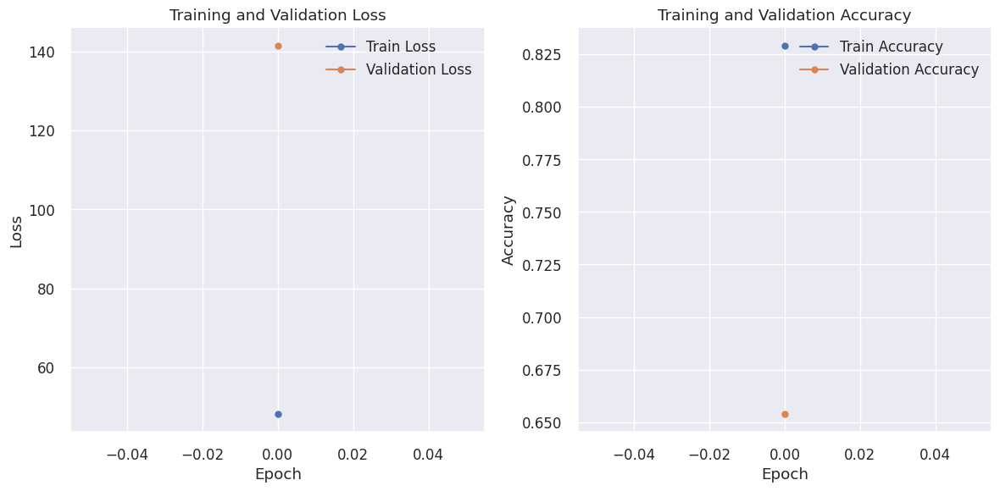

In [19]:
def plot_training_history(history):
    # Loss plot
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history['train_loss'], label='Train Loss', marker='o')
    plt.plot(history['val_loss'], label='Validation Loss', marker='o')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    # Accuracy Plot
    plt.subplot(1, 2, 2)
    plt.plot(history['train_acc'], label='Train Accuracy', marker='o')
    plt.plot(history['val_acc'], label='Validation Accuracy', marker='o')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    # Show the plots
    plt.tight_layout()
    plt.show()

plot_training_history(history)

# Function to evaluate a model

In [20]:
def evaluate_model(model, dataloader, criterion):
    model.to(device)
    model.eval() # set the model in 'evaluation mode'

    total_loss = 0.0
    total_correct = 0
    total_samples = 0

    with torch.no_grad(): # disable gradient updates 
        for inputs, labels, _ in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)

            # prediction 
            outputs = model(inputs)
            loss = criterion(outputs, labels)

            # acummulate loss            
            total_loss += loss.item() * inputs.size(0)

            # count the number of correct
            _, preds = torch.max(outputs, 1)
            total_correct += (preds == labels).sum().item()
            total_samples += labels.size(0)

    # calculate average loss and accuracy
    avg_loss = total_loss / total_samples
    avg_acc = total_correct / total_samples
    return avg_loss, avg_acc

# evaluate on each dataset
train_loss, train_acc = evaluate_model(model, train_loader, criterion)
print(f'Training data -> loss: {train_loss:.3f}, acc: {train_acc:.3f}')

eval_loss, eval_acc = evaluate_model(model, val_loader, criterion)
print(f'Cross-val data -> loss: {eval_loss:.3f}, acc: {eval_acc:.3f}')

test_loss, test_acc = evaluate_model(model, test_loader, criterion)
print(f'Testing data -> loss: {test_loss:.3f}, acc: {test_acc:.3f}')

Training data -> loss: 40.911, acc: 0.857
Cross-val data -> loss: 141.475, acc: 0.654
Testing data -> loss: 136.586, acc: 0.660


# To save our computing power

In [21]:
# save the trained model
torch.save(model.state_dict(),"/kaggle/working/model.pth")

In [22]:
'''
# release the GPU memory by deleting the model object
#del model

# To reload the trained model;
# initialize the model (with initial weights and biases)
model, criterion, optimizer = build_model()

# load the weights and biases into the model
model.load_state_dict(torch.load("/kaggle/working/model.pth"))
model.to(device)

from torchinfo import summary
print(summary(model, input_size=(1, NUM_CHANNELS, IMAGE_HEIGHT, IMAGE_WIDTH))) # for batch_size = 1
'''

'\n# release the GPU memory by deleting the model object\n#del model\n\n# To reload the trained model;\n# initialize the model (with initial weights and biases)\nmodel, criterion, optimizer = build_model()\n\n# load the weights and biases into the model\nmodel.load_state_dict(torch.load("/kaggle/working/model.pth"))\nmodel.to(device)\n\nfrom torchinfo import summary\nprint(summary(model, input_size=(1, NUM_CHANNELS, IMAGE_HEIGHT, IMAGE_WIDTH))) # for batch_size = 1\n'

## Running Prediction

In [23]:
# Display sample from test dataset
print(f'Running predictions on {len(test_dataset)} test records...')

#test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)
actuals, predictions = [], []

# Ensure model is in evaluation mode
model.eval()

with torch.no_grad(): # Disable gradient computation for inference
    for batch_no, (images, labels, _) in enumerate(test_loader):
        images = images.to(device)
        labels = labels.to(device)

        # Get predictions
        outputs = model(images) # Forward pass
        preds = torch.argmax(outputs, dim=1) # Get class indices

        actuals.extend(labels.cpu().numpy().ravel())
        predictions.extend(preds.cpu().numpy().ravel())

# Convert lists to numpy arrays
actuals = np.array(actuals)
predictions = np.array(predictions)

print('Sample actual values & predictions...')
print('  - Actual values: ', actuals[:32])
print('  - Precictions  : ', predictions[:32])

# Calculate accuracy
correct_preds = (actuals == predictions).sum()
acc = correct_preds / len(actuals)
print(f'  We got {correct_preds} of {len(actuals)} correct ({acc:.3f} accuracy)')

# Display classification report and confusion matrix
print(classification_report(actuals, predictions))
print('Confusion Matrix:')
print(confusion_matrix(actuals, predictions))

Running predictions on 13202 test records...
Sample actual values & predictions...
  - Actual values:  [1 0 1 0 1 0 0 0 0 0 1 1 1 0 1 1 1 0 1 1 0 0 1 0 0 0 1 1 0 1 1 0]
  - Precictions  :  [0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0]
  We got 8714 of 13202 correct (0.660 accuracy)
              precision    recall  f1-score   support

           0       0.65      0.91      0.76      7855
           1       0.69      0.29      0.41      5347

    accuracy                           0.66     13202
   macro avg       0.67      0.60      0.59     13202
weighted avg       0.67      0.66      0.62     13202

Confusion Matrix:
[[7154  701]
 [3787 1560]]


# Actual/Prediction Visualizer

torch.Size([64, 3, 96, 96]) torch.Size([64]) (64,)


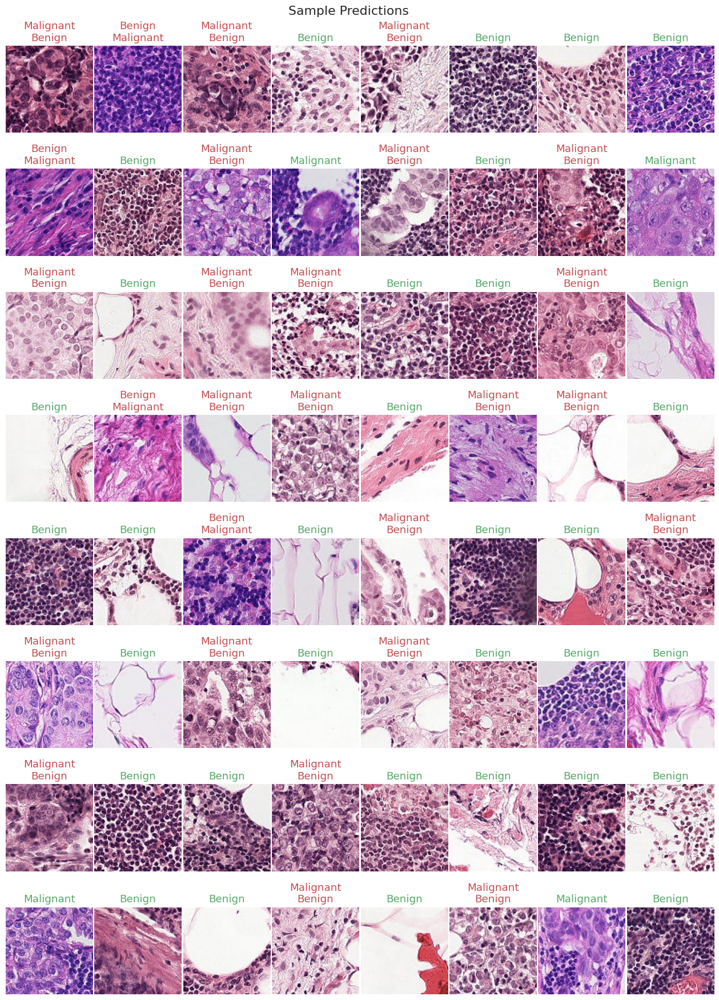

In [24]:
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=64, shuffle=False)
data_iter = iter(test_loader)

images, labels, _ = next(data_iter)

# model prediction
images = images.to(device) 
preds = model(images)
preds = torch.argmax(preds, dim=1).cpu().numpy()

# print the result
print(images.shape, labels.shape, preds.shape)

# plot the sample
display_sample(images.cpu().numpy(), labels.cpu().numpy(), sample_predictions=preds,
               grid_shape=(8, 8), fig_size=(16, 20), plot_title='Sample Predictions')

# Submission File Generator

Here we will start handling the 'real' test data in (/kaggle/input).  
Let's check the raw test data; how many files do we have.

In [27]:
# set directory where the test data is
TEST_DATA_DIR = '/kaggle/input/histopathologic-cancer-detection/test'

# Real test dataset; we call it z_test_dataset
z_test_images = [f for f in os.listdir(TEST_DATA_DIR) if f.endswith('.tif')]
print(f'Number of z_test_images: {len(z_test_images)}')

Number of z_test images: 57458


In [28]:
# retrieve path and ids from z_test datasets
z_test_paths = []
z_test_ids = []

for f in os.listdir(TEST_DATA_DIR):
    z_test_paths.append(os.path.join(TEST_DATA_DIR, f)) # full path
    z_test_ids.append(os.path.splitext(f)[0]) # file name excluded '.tif'

# prepare the dataset to feed dataloader
z_test_dataset = HistoDataset(z_test_paths, ids=z_test_ids, transforms=xforms['test'])
z_test_loader = DataLoader(z_test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=num_workers)

# Ensure model is in evaluation mode
model.eval()

# Store predictions
predictions = []
image_ids = [] 

# Generate predictions
with torch.no_grad():
    for batch_no, (images, ids) in enumerate(z_test_loader):
        images = images.to(device)

        # Get predictions
        outputs = model(images)
        preds = torch.argmax(outputs, dim=1)

        # Append results
        predictions.extend(preds.cpu().numpy())
        image_ids.extend(ids) 

# Create a submission DataFrame
submission = pd.DataFrame({
    'id': image_ids,
    'label': predictions
})

# Save to CSV
submission.to_csv('submission.csv', index=False)
print("Submission file created: submission.csv")

Submission file created: submission.csv


In [29]:
import pandas as pd
true_sub = pd.read_csv('/kaggle/working/submission.csv')
print(true_sub.shape)
true_sub[:10]

(57458, 2)


,id,label
0,a7ea26360815d8492433b14cd8318607bcf99d9e,0
1,59d21133c845dff1ebc7a0c7cf40c145ea9e9664,0
2,5fde41ce8c6048a5c2f38eca12d6528fa312cdbb,0
3,bd953a3b1db1f7041ee95ff482594c4f46c73ed0,1
4,523fc2efd7aba53e597ab0f69cc2cbded7a6ce62,1
5,d23c66547f4a00555a174d2fcb860ae399b66edc,1
6,fabf2fca23f71655974767e29eda86a9b2c97a72,0
7,9730b15862516b8641b9f0ff48db660d95031c32,0
8,ee85348c0950c2e639776fb555e3452c1f8437c0,0
9,ef12a0813c504d2d1b2ba485e78d380ad64a0622,0


In [30]:
del model

# Conclusion
このノートブックの主要なｺｰﾄﾞはManish Bhobeによるgithubﾍﾟｰｼﾞの参照に基づいています。

このCNNがｼﾝﾌﾟﾙな設計ながら、高い精度を出すことができるのはManish Bhobeがdata preprocessingと hyperparameter tuningに注意深く注力した結果だと思います。

彼のｺｰﾄﾞが教えてくれるのはﾃﾞｰﾀｻｲｴﾝｽはmodel buildingが主役ではなく、ﾃﾞｰﾀが主役で、そのﾃﾞｰﾀを調理することでｼﾝﾌﾟﾙなﾓﾃﾞﾙでも高い精度のﾊﾟﾌｫｰﾏﾝｽを発揮できるということです。

また予測結果を予測ラベル付きでビジュアライズするなど、viewer friendlyなｺｰﾄﾞはviewerの理解と分析を押し上げます。

ﾓﾃﾞﾙを保存、削除することでメモリ効率を上げる、ﾒﾓﾘの無駄遣いを排除する。

今後の取り組みとして、自身でのhyperparameter tuning, VGGやResNetの設計、Transformerを理解した上でViTに取り組みたいです。
Manish Bhobe, 素晴らしいｺｰﾄﾞを共有してくれてありがとうございます。

# Resources
Histopathological Cancer Detection - Binary Classification Kaggle Challenge by Manish Bhobe
https://github.com/mjbhobe/dl-pytorch/blob/master/Pytorch%20-%20Histopathology%20Detection%20-%20Binary%20Classification.ipynb